In [283]:
from libraries import *
from parameters import *
from sklearn.cross_decomposition import PLSCanonical, PLSRegression, CCA
from sklearn.model_selection import cross_val_score
from numpy import asarray
from numpy import savetxt
from adjustText import adjust_text
import scvi
import seaborn as sns
from sklearn.cluster import SpectralBiclustering
%matplotlib inline

In [284]:
coefsAll = pd.read_csv("/home/beraslan/jovian-work/analysisSingle/MixedEffectLMOutputs/ME_SignificantBetaCoefs.csv", header=0, index_col=0)
coefsAll.index = [cond.split('_')[1] for cond in coefsAll.index]

In [285]:
# n_clusters = (6, 10)
# model = SpectralBiclustering(n_clusters=n_clusters, method='log',
#                              random_state=0)
# model.fit(coefsAll)

In [286]:
# pd.DataFrame(model.row_labels_).value_counts()

In [287]:
# guideModulesBiClustering = pd.DataFrame({"GuideName" : coefsAll.index, "GuideGroup" : model.row_labels_})
# guideModulesBiClustering = guideModulesBiClustering.sort_values(["GuideGroup", "GuideName"], ascending = (True, True))
# guideModulesBiClustering

In [288]:
# guideModulesBiClustering.to_csv("/home/beraslan/jovian-work/analysisSingle/ME_GuideModules_biClustering_6_Modules.csv")



In [289]:
# geneModulesBiClustering = pd.DataFrame({"GeneName" : coefsAll.columns, "GeneGroup" : model.column_labels_})
# geneModulesBiClustering = geneModulesBiClustering.sort_values(["GeneGroup", "GeneName"], ascending = (True, True))
# geneModulesBiClustering

In [290]:
# geneModulesBiClustering.to_csv("/home/beraslan/jovian-work/analysisSingle/ME_GeneModules_biClustering_10_Modules.csv")


In [291]:
# fit_data = coefsAll.iloc[np.argsort(model.row_labels_)]
# fit_data = fit_data.iloc[:, np.argsort(model.column_labels_)]


In [292]:

# fig, ax = plt.subplots(figsize=(10,30))
# ax.matshow(fit_data, cmap=plt.cm.coolwarm, vmin=-0.2, vmax=0.2)
#fig.colorbar(cax)
#plt.title("After biclustering; rearranged to show biclusters")


In [293]:
# fit_data

In [294]:
# guideCov = pd.DataFrame(np.corrcoef(fit_data), index=fit_data.index, columns=fit_data.index)

In [295]:
# fig = plt.figure(figsize=(8,8))
# ax = fig.add_subplot(111)
# cax = ax.matshow(guideCov, cmap=plt.cm.PRGn, vmin=-0.5, vmax=0.5)
#fig.colorbar(cax, orientation="horizontal")

In [296]:
# geneCov = pd.DataFrame(np.corrcoef(fit_data.transpose()), index=fit_data.columns, columns=fit_data.columns)

In [297]:
# fig = plt.figure(figsize=(8,8))
# ax = fig.add_subplot(111)
# cax = ax.matshow(geneCov, cmap=plt.cm.RdBu, vmin=-0.5, vmax=0.5)
#fig.colorbar(cax, orientation="vertical")

Generate guide modules with leiden

computing PCA
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 6 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


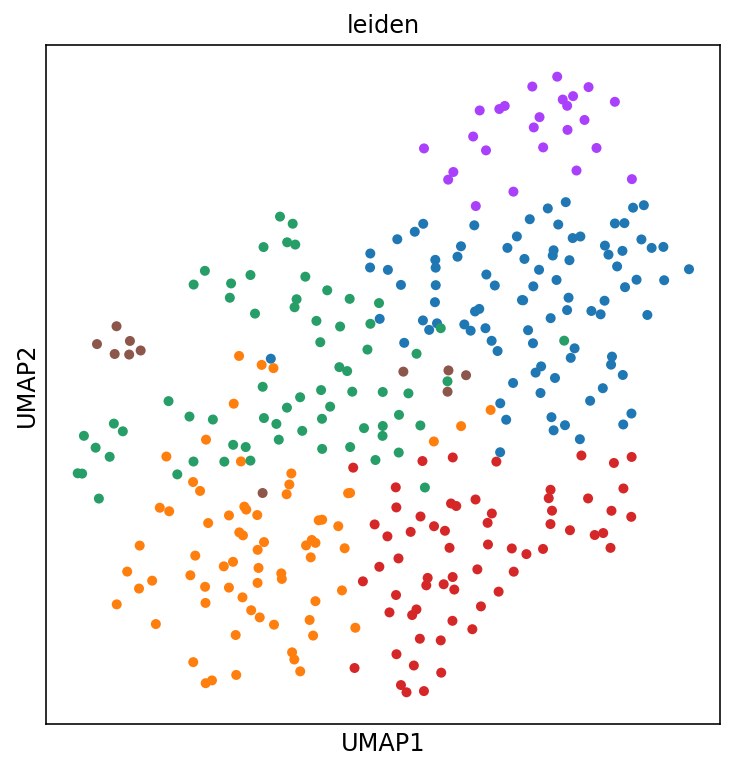

In [298]:
koGuidesAnnDat = sc.AnnData(X=coefsAll)
sc.pp.pca(koGuidesAnnDat, n_comps=50, svd_solver='arpack')
sc.pp.neighbors(koGuidesAnnDat)
sc.tl.leiden(koGuidesAnnDat, resolution=0.9)
sc.tl.umap(koGuidesAnnDat)
koGuidesAnnDat.obs["KOGenes"] = coefsAll.index

f, ax = plt.subplots(figsize=(6, 6))
sc.pl.umap(koGuidesAnnDat, color='leiden',ax=ax, size=100,  legend_fontoutline=3, legend_loc = 'center',legend_fontsize=14, legend_fontweight='normal')

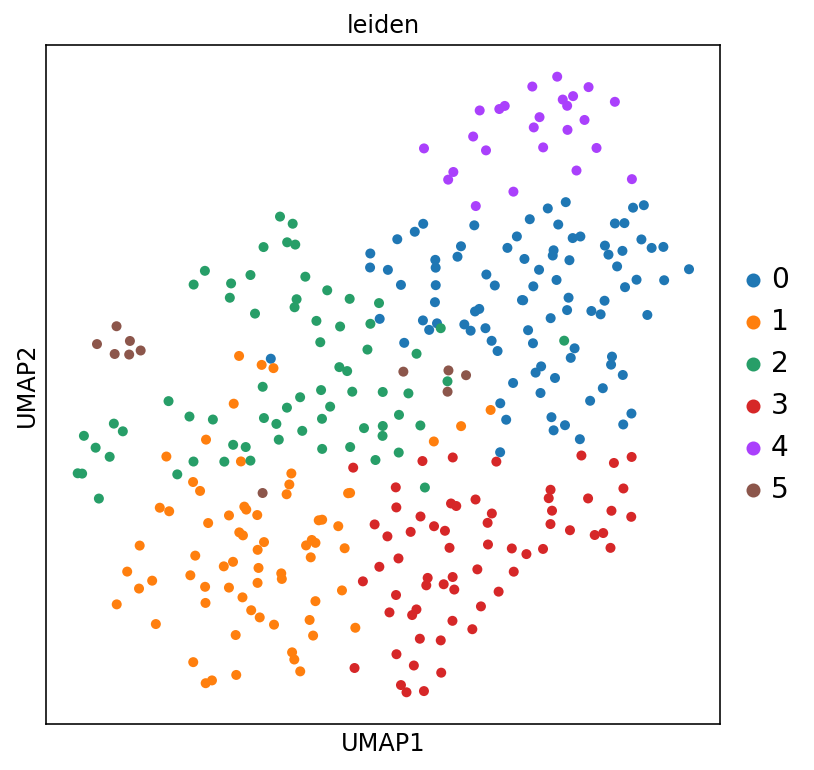

In [299]:
f, ax = plt.subplots(figsize=(6, 6))
sc.pl.umap(koGuidesAnnDat, color='leiden',ax=ax, size=100,  legend_fontoutline=3, legend_fontsize=14,legend_loc='right margin', legend_fontweight='normal')

In [300]:
nClust=len(koGuidesAnnDat.obs["leiden"].unique())
guideModules = koGuidesAnnDat.obs[["KOGenes", "leiden"]]
guideModules.columns = ["GuideName", "GuideGroup"]
guideModules

,GuideName,GuideGroup
Aamp,Aamp,4
Acaca,Acaca,3
Ago2,Ago2,0
Ahctf1,Ahctf1,2
Ahr,Ahr,0
...,...,...
Zbtb7b,Zbtb7b,2
Zfp106,Zfp106,3
Zfp91,Zfp91,3
Zmiz1,Zmiz1,0


In [301]:
guideModules = guideModules.sort_values(["GuideGroup", "GuideName"], ascending = (True, True))

In [302]:
guideModulesNew = pd.concat([guideModules.loc[guideModules.GuideGroup=="4",], guideModules.loc[guideModules.GuideGroup=="0",]])
guideModulesNew = pd.concat([guideModulesNew, guideModules.loc[guideModules.GuideGroup=="1",]])
guideModulesNew = pd.concat([guideModulesNew, guideModules.loc[guideModules.GuideGroup=="5",]])
guideModulesNew = pd.concat([guideModulesNew, guideModules.loc[guideModules.GuideGroup=="3",]])
guideModulesNew = pd.concat([guideModulesNew, guideModules.loc[guideModules.GuideGroup=="2",]])


guideModules = guideModulesNew

In [303]:
guideCov = pd.DataFrame(np.corrcoef(coefsAll), index=coefsAll.index, columns=coefsAll.index)
guideCov = guideCov.loc[guideModules.GuideName,guideModules.GuideName]

In [304]:
guideModules

,GuideName,GuideGroup
Aamp,Aamp,4
Bop1,Bop1,4
Cirh1a,Cirh1a,4
Dcaf13,Dcaf13,4
Grb2,Grb2,4
...,...,...
Wdr20,Wdr20,2
Wdr26,Wdr26,2
Wdr33,Wdr33,2
Zbtb17,Zbtb17,2


In [305]:
guideModules["GuideColor"] = ""
guideModules.loc[guideModules["GuideGroup"] == "0", "GuideColor"] = koGuidesAnnDat.uns["leiden_colors"][0]
guideModules.loc[guideModules["GuideGroup"] == "1", "GuideColor"] = koGuidesAnnDat.uns["leiden_colors"][1]
guideModules.loc[guideModules["GuideGroup"] == "2", "GuideColor"] = koGuidesAnnDat.uns["leiden_colors"][2]
guideModules.loc[guideModules["GuideGroup"] == "3", "GuideColor"] = koGuidesAnnDat.uns["leiden_colors"][3]
guideModules.loc[guideModules["GuideGroup"] == "4", "GuideColor"] = koGuidesAnnDat.uns["leiden_colors"][4]
guideModules.loc[guideModules["GuideGroup"] == "5", "GuideColor"] = koGuidesAnnDat.uns["leiden_colors"][5]

In [306]:
guideModules

,GuideName,GuideGroup,GuideColor
Aamp,Aamp,4,#aa40fc
Bop1,Bop1,4,#aa40fc
Cirh1a,Cirh1a,4,#aa40fc
Dcaf13,Dcaf13,4,#aa40fc
Grb2,Grb2,4,#aa40fc
...,...,...,...
Wdr20,Wdr20,2,#279e68
Wdr26,Wdr26,2,#279e68
Wdr33,Wdr33,2,#279e68
Zbtb17,Zbtb17,2,#279e68


In [307]:
guideModules.GuideGroup.value_counts()

0    91
1    70
2    68
3    64
4    25
5    11
Name: GuideGroup, dtype: int64

In [308]:
guideModules.GuideGroup.unique()

['4', '0', '1', '5', '3', '2']
Categories (6, object): ['4', '0', '1', '5', '3', '2']

In [309]:
# gGroups = guideModules.GuideGroup.cat.codes
# lut = dict(zip(set(gGroups), sns.hls_palette(len(set(gGroups)), l=0.5, s=0.8)))
# row_colors = pd.DataFrame(gGroups)[0].map(lut)

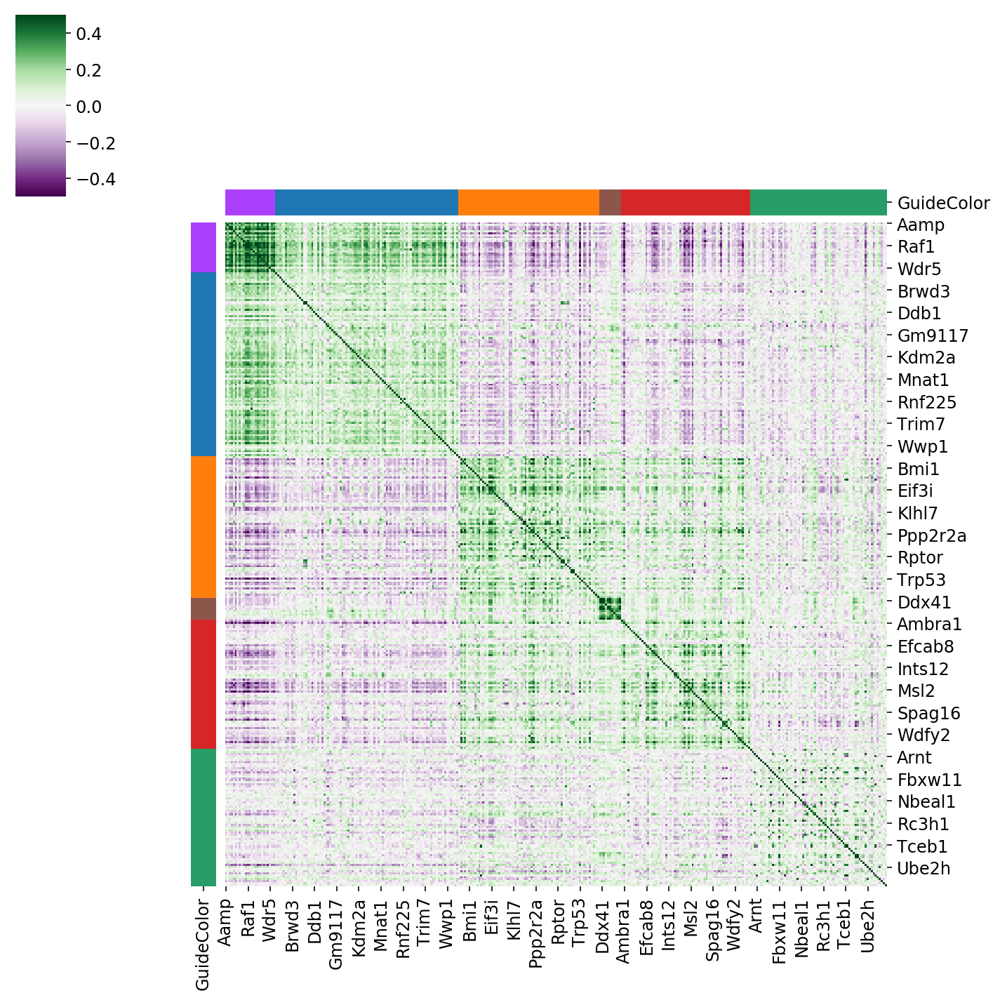

In [310]:
sns.clustermap(guideCov, row_cluster=False, col_cluster= False, cmap=plt.cm.PRGn, vmin=-0.5, vmax=0.5, row_colors=guideModules.GuideColor, col_colors=guideModules.GuideColor)


In [311]:

# fig = plt.figure(figsize=(8,8))
# ax = fig.add_subplot(111)
# cax = ax.matshow(guideCov, cmap=plt.cm.PRGn, vmin=-0.5, vmax=0.5, )
#fig.colorbar(cax, orientation="horizontal")

In [312]:
guideModules.to_csv("/home/beraslan/jovian-work/analysisSingle/ME_GuideModules_leiden_"+str(nClust)+"_Modules.csv")

Generate gene modules with leiden

computing PCA
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)


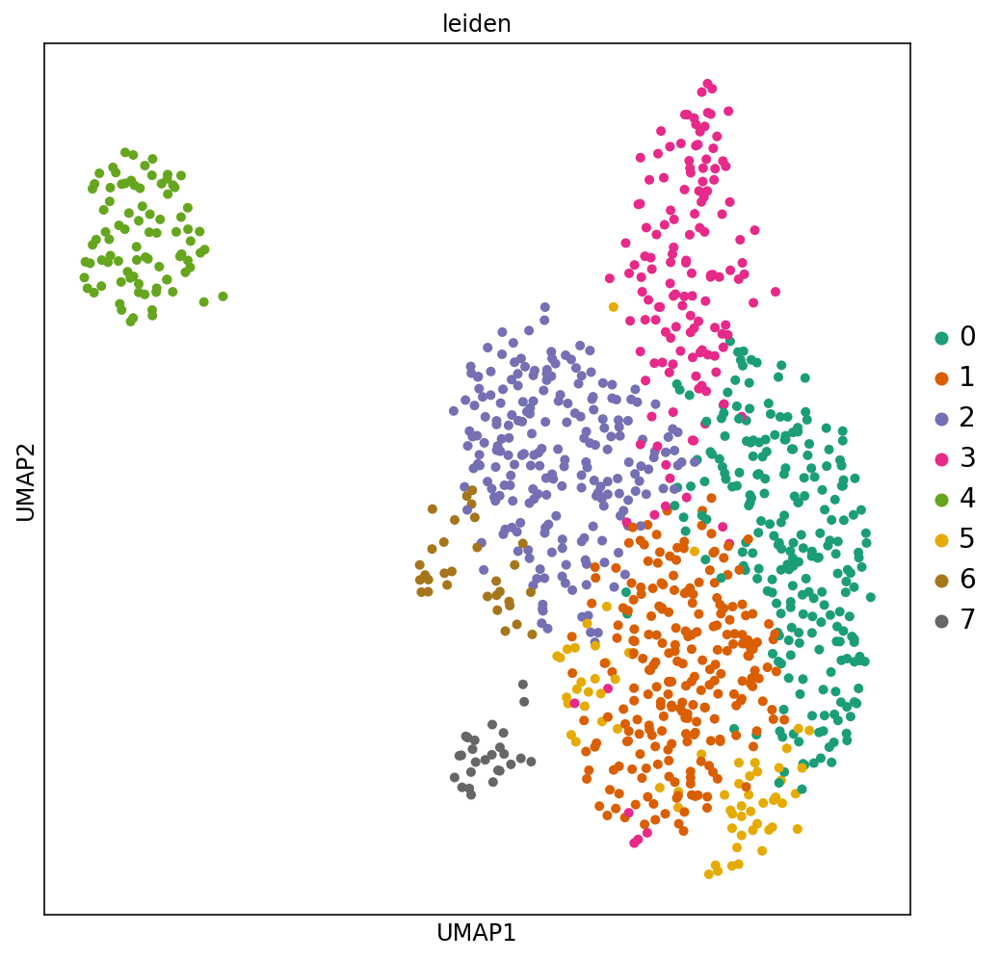

In [313]:
koGenesAnnDat = sc.AnnData(X=coefsAll.transpose())
sc.pp.pca(koGenesAnnDat, n_comps=50, svd_solver='arpack')
sc.pp.neighbors(koGenesAnnDat)
sc.tl.leiden(koGenesAnnDat, resolution=0.8)
sc.tl.umap(koGenesAnnDat)
koGenesAnnDat.obs["EffectedGenes"] = coefsAll.columns

f, ax = plt.subplots(figsize=(8, 8))
sc.pl.umap(koGenesAnnDat, color='leiden',ax=ax, size=100, palette = 'Dark2', legend_fontoutline=3, legend_fontsize=14,legend_loc='right margin', legend_fontweight='normal')

In [314]:
nClust=len(koGenesAnnDat.obs["leiden"].unique())
geneModules = koGenesAnnDat.obs[["EffectedGenes", "leiden"]]
geneModules.columns = ["GeneName", "GeneGroup"]
geneModules

,GeneName,GeneGroup
Tram1,Tram1,6
Rpl7,Rpl7,4
Ptp4a1,Ptp4a1,1
Ptpn18,Ptpn18,0
Plekhb2,Plekhb2,1
...,...,...
Pgam1,Pgam1,7
Scd2,Scd2,2
Scd1,Scd1,2
Nfkb2,Nfkb2,0


In [315]:
geneModules = geneModules.sort_values(["GeneGroup", "GeneName"], ascending = (True, True))

In [316]:
geneModules

,GeneName,GeneGroup
AC160336.1,AC160336.1,0
AI504432,AI504432,0
AW112010,AW112010,0
Acsl1,Acsl1,0
Actr3,Actr3,0
...,...,...
Pgm2,Pgm2,7
Pkm,Pkm,7
Slc16a3,Slc16a3,7
Slc2a1,Slc2a1,7


In [317]:
dark2Palette = ["#1B9E77", "#D95F02", "#7570B3", "#E7298A", "#66A61E", "#E6AB02", "#A6761D", "#666666"]
geneModules["GeneColor"] = ""
geneModules.loc[geneModules["GeneGroup"] == "0", "GeneColor"] = dark2Palette[0]
geneModules.loc[geneModules["GeneGroup"] == "1", "GeneColor"] = dark2Palette[1]
geneModules.loc[geneModules["GeneGroup"] == "2", "GeneColor"] = dark2Palette[2]
geneModules.loc[geneModules["GeneGroup"] == "3", "GeneColor"] = dark2Palette[3]
geneModules.loc[geneModules["GeneGroup"] == "4", "GeneColor"] = dark2Palette[4]
geneModules.loc[geneModules["GeneGroup"] == "5", "GeneColor"] = dark2Palette[5]
geneModules.loc[geneModules["GeneGroup"] == "6", "GeneColor"] = dark2Palette[6]
geneModules.loc[geneModules["GeneGroup"] == "7", "GeneColor"] = dark2Palette[7]

In [318]:
#geneModulesNew = pd.concat([geneModules.loc[geneModules.GeneGroup.isin(["0","1","2","4","6","7"]),], geneModules.loc[geneModules.GeneGroup.isin(["3","5"]),]])

geneModulesNew = pd.concat([geneModules.loc[geneModules.GeneGroup=="3",], geneModules.loc[geneModules.GeneGroup=="6",]])
geneModulesNew = pd.concat([geneModulesNew, geneModules.loc[geneModules.GeneGroup=="7",]])

geneModulesNew = pd.concat([geneModulesNew, geneModules.loc[geneModules.GeneGroup=="2",]])
geneModulesNew = pd.concat([geneModulesNew, geneModules.loc[geneModules.GeneGroup=="4",]])
geneModulesNew = pd.concat([geneModulesNew, geneModules.loc[geneModules.GeneGroup=="0",]])

geneModulesNew = pd.concat([geneModulesNew, geneModules.loc[geneModules.GeneGroup=="1",]])
geneModulesNew = pd.concat([geneModulesNew, geneModules.loc[geneModules.GeneGroup=="5",]])


geneModulesNew


,GeneName,GeneGroup,GeneColor
AI314180,AI314180,3,#E7298A
Abcc1,Abcc1,3,#E7298A
Acod1,Acod1,3,#E7298A
Akr1a1,Akr1a1,3,#E7298A
Alas1,Alas1,3,#E7298A
...,...,...,...
Socs2,Socs2,5,#E6AB02
Socs6,Socs6,5,#E6AB02
St3gal5,St3gal5,5,#E6AB02
Tmsb10,Tmsb10,5,#E6AB02


In [319]:
geneModules = geneModulesNew

In [320]:
geneCov = pd.DataFrame(np.corrcoef(coefsAll.transpose()), index=coefsAll.columns, columns=coefsAll.columns)
geneCov = geneCov.loc[geneModules.GeneName,geneModules.GeneName]

In [321]:
geneModules.GeneGroup.value_counts()

0    236
1    235
2    219
3    143
4     86
5     65
6     31
7     26
Name: GeneGroup, dtype: int64

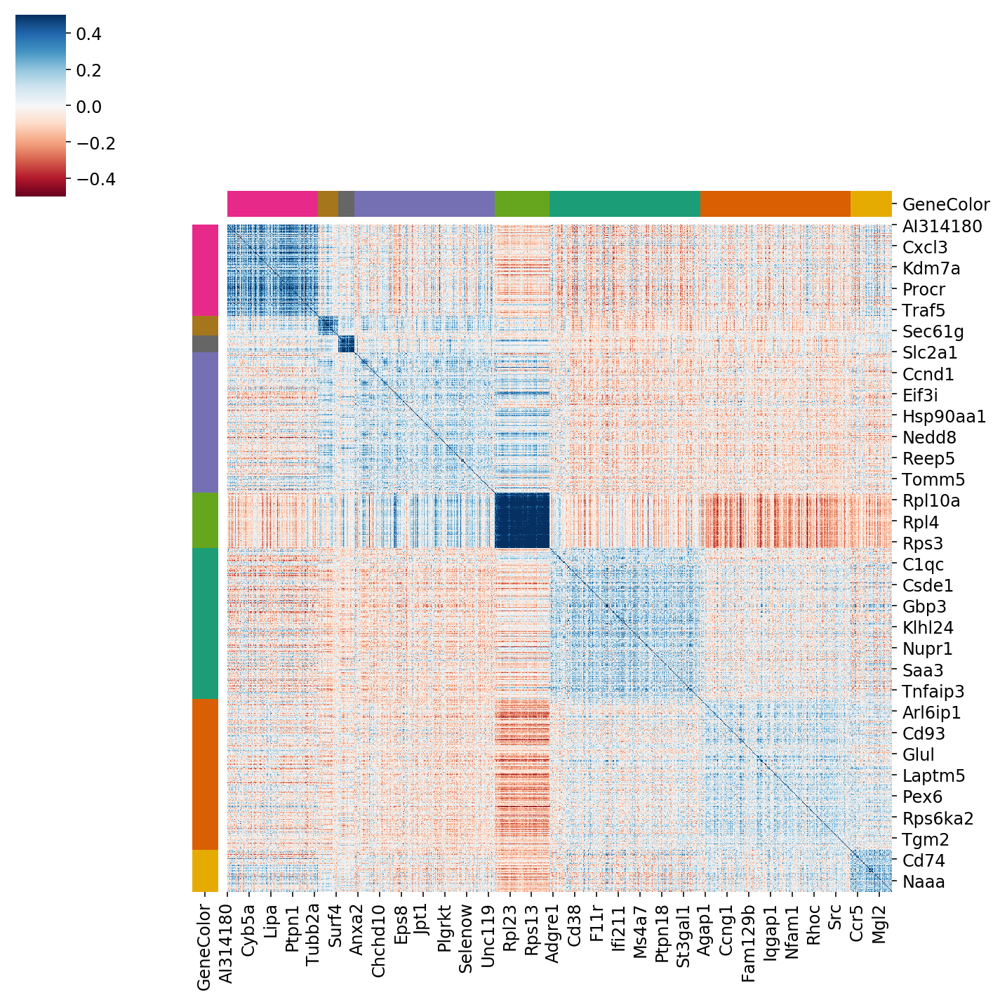

In [322]:
sns.clustermap(geneCov, row_cluster=False, col_cluster= False, cmap=plt.cm.RdBu, vmin=-0.5, vmax=0.5, row_colors=geneModules.GeneColor, col_colors=geneModules.GeneColor)


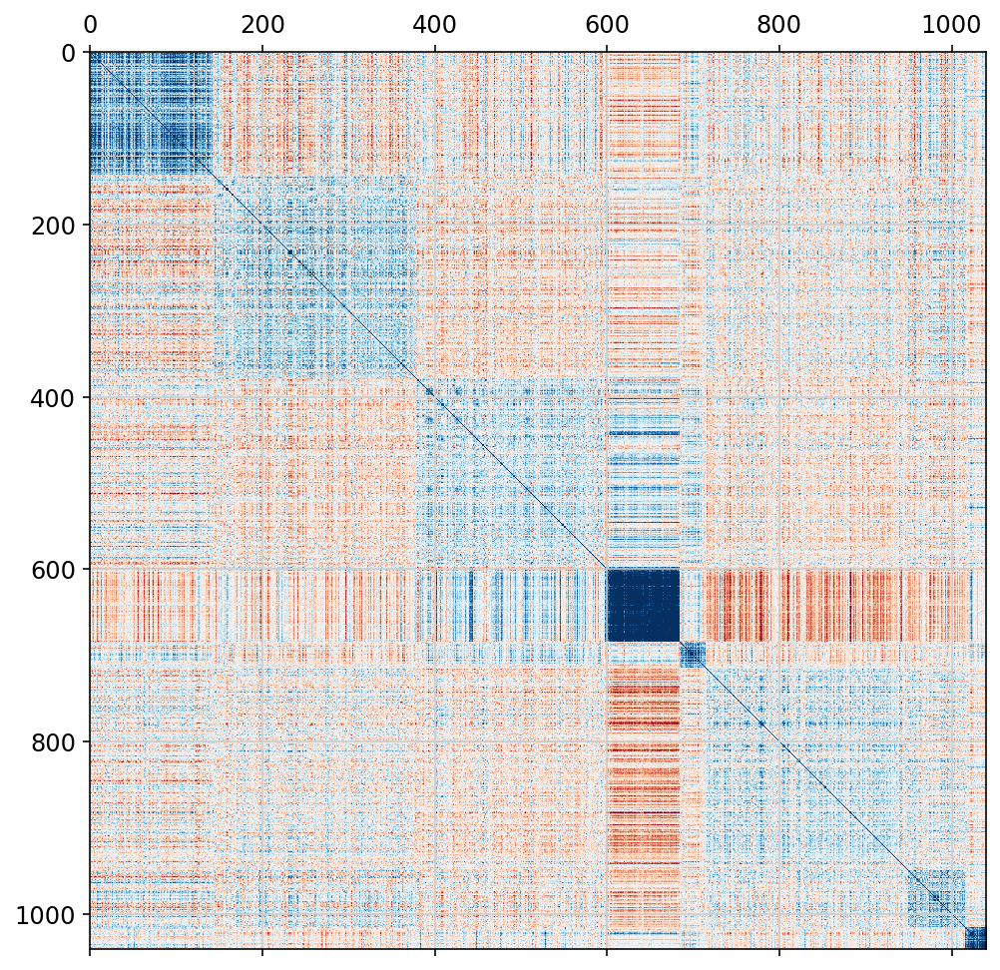

In [242]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111)
cax = ax.matshow(geneCov, cmap=plt.cm.RdBu, vmin=-0.5, vmax=0.5)
#fig.colorbar(cax, orientation="horizontal")

In [323]:
geneModules.to_csv("/home/beraslan/jovian-work/analysisSingle/ME_GeneModules_leiden_"+str(nClust)+"_Modules.csv")

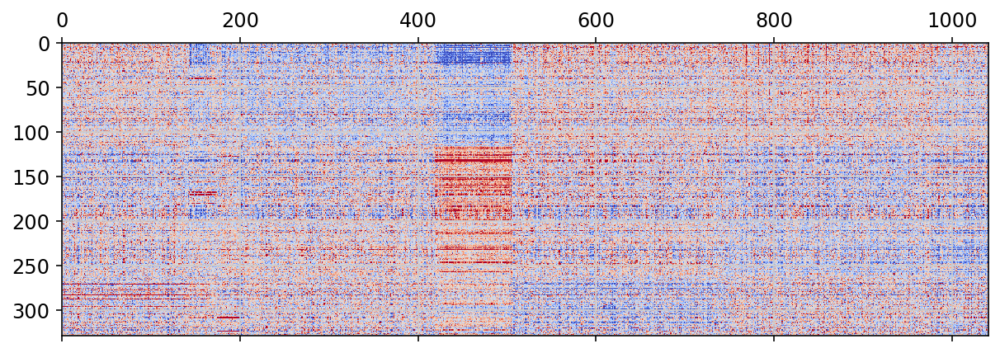

In [325]:
fig, ax = plt.subplots(figsize=(10,10))
ax.matshow(coefsAll.loc[guideCov.index, geneCov.index], cmap=plt.cm.coolwarm, vmin=-0.2, vmax=0.2)


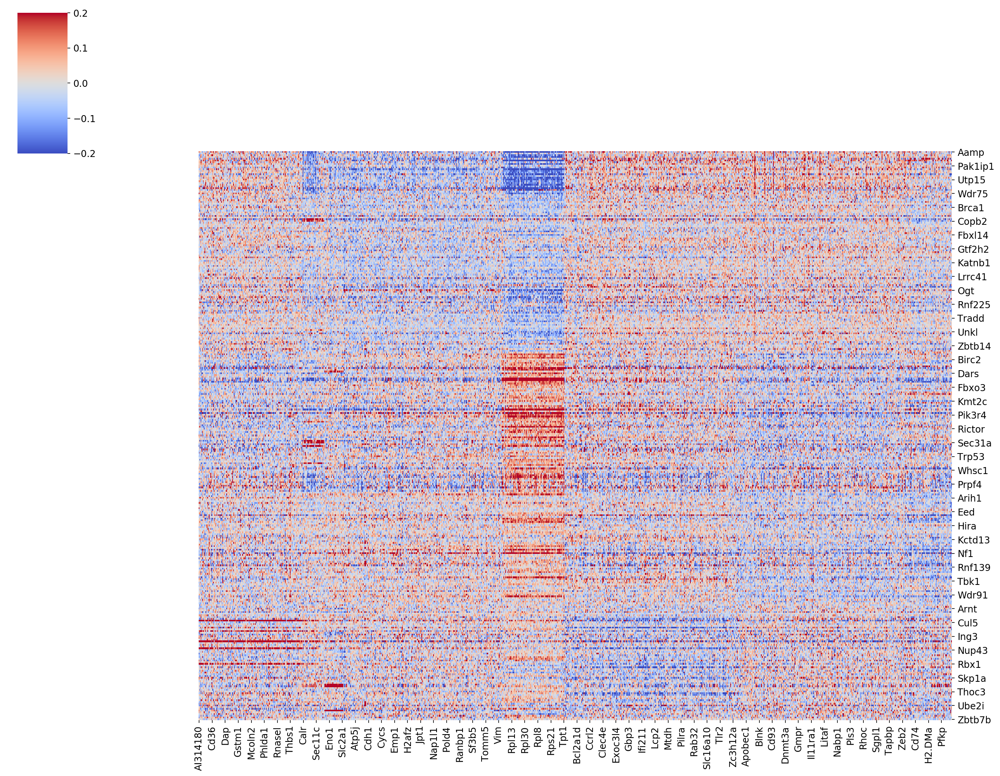

In [329]:
sns.clustermap(coefsAll.loc[guideCov.index, geneCov.index], row_cluster=False, col_cluster= False, cmap=plt.cm.coolwarm, vmin=-0.2, vmax=0.2, figsize=(18,14))


In [ ]:
# koGenesAnnDat.obs['clusCol'] = koGenesAnnDat.obs['leiden'].astype("category").cat.codes

# koGenesAnnDat.obs['clusCol'][koGenesAnnDat.obs['clusCol'] == 0] = "#FF00FF" 
# koGenesAnnDat.obs['clusCol'][koGenesAnnDat.obs['clusCol'] == 1] = "#008080" 
# koGenesAnnDat.obs['clusCol'][koGenesAnnDat.obs['clusCol'] == 2] = "#0000FF" 
# koGenesAnnDat.obs['clusCol'][koGenesAnnDat.obs['clusCol'] == 3] = "#FF0000" 
# koGenesAnnDat.obs['clusCol'][koGenesAnnDat.obs['clusCol'] == 4] = "#008000" 
# koGenesAnnDat.obs['clusCol'][koGenesAnnDat.obs['clusCol'] == 5] = "#00FF00" 
# koGenesAnnDat.obs['clusCol'][koGenesAnnDat.obs['clusCol'] == 6] = "#00FFFF" 
# koGenesAnnDat.obs['clusCol'][koGenesAnnDat.obs['clusCol'] == 7] = "#011000" 
# koGenesAnnDat.obs['clusCol'][koGenesAnnDat.obs['clusCol'] == 8] = "#011100" 

In [ ]:
# umap_combo = dict(zip(koGenesAnnDat.obs['KOGenes'], koGenesAnnDat.obsm['X_umap']))
# col_dict = dict(zip(koGenesAnnDat.obs['KOGenes'], koGenesAnnDat.obs['clusCol']))
# atomic_drugs = list(umap_combo.keys())

# f, ax = plt.subplots(figsize=(20, 20))
# ax.grid('off')
# ax.axis('off')
# for i, drug in enumerate(atomic_drugs):
#     ax.scatter(umap_combo[drug][0], umap_combo[drug][1], alpha=0.9, s=6, color=col_dict[drug])
    
    
# texts = []

# for l, drug in enumerate(atomic_drugs):
        
#     texts.append(ax.text(umap_combo[drug][0], umap_combo[drug][1], 
#                                     drug, fontsize=13, color=col_dict[drug]))
    
# adjust_text(texts, arrowprops=dict(arrowstyle='-', color='black', lw=0.1))

# plt.show()   